In [23]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

np.random.seed(42)

In [24]:
prices = pd.read_csv("prices.txt", sep=r"\s+", header=None)
prices.columns = [f"Instr_{i}" for i in prices.columns]
prices.index   = pd.RangeIndex(len(prices))          # 0-999

In [25]:
ohlc_list = []
for col in prices.columns:
    close = prices[col]
    open_ = close.shift().fillna(close.iloc[0])
    high  = np.maximum(open_, close)
    low   = np.minimum(open_, close)
    ohlc_list.append(
        pd.DataFrame({"open": open_,
                      "high": high,
                      "low":  low,
                      "close": close},
                     index=prices.index)
    )

In [26]:
from typing import List, Union

def get_permutation(
    ohlc: Union[pd.DataFrame, List[pd.DataFrame]],
    start_index: int = 0,
    seed=None,
):
    assert start_index >= 0
    np.random.seed(seed)

    if isinstance(ohlc, list):
        time_index = ohlc[0].index
        for mkt in ohlc:
            assert (time_index == mkt.index).all(), "Indexes do not match"
        n_markets = len(ohlc)
    else:
        n_markets = 1
        time_index = ohlc.index
        ohlc = [ohlc]

    n_bars = len(ohlc[0])
    perm_index = start_index + 1
    perm_n = n_bars - perm_index

    start_bar = np.empty((n_markets, 4))
    r_open  = np.empty((n_markets, perm_n))
    r_high  = np.empty((n_markets, perm_n))
    r_low   = np.empty((n_markets, perm_n))
    r_close = np.empty((n_markets, perm_n))

    for i, bars in enumerate(ohlc):
        log = np.log(bars[["open", "high", "low", "close"]])
        start_bar[i] = log.iloc[start_index].to_numpy()
        r_open[i]  = (log["open"]  - log["close"].shift()).to_numpy()[perm_index:]
        r_high[i]  = (log["high"]  - log["open"]).to_numpy()[perm_index:]
        r_low[i]   = (log["low"]   - log["open"]).to_numpy()[perm_index:]
        r_close[i] = (log["close"] - log["open"]).to_numpy()[perm_index:]

    idx  = np.arange(perm_n)
    p1   = np.random.permutation(idx)
    p2   = np.random.permutation(idx)
    r_high, r_low, r_close = r_high[:, p1], r_low[:, p1], r_close[:, p1]
    r_open = r_open[:, p2]

    out = []
    for i, bars in enumerate(ohlc):
        perm = np.zeros((n_bars, 4))
        logb = np.log(bars[["open", "high", "low", "close"]]).to_numpy()
        perm[:start_index] = logb[:start_index]
        perm[start_index]  = start_bar[i]

        for j in range(perm_index, n_bars):
            k = j - perm_index
            perm[j, 0] = perm[j - 1, 3] + r_open[i][k]
            perm[j, 1] = perm[j, 0]   + r_high[i][k]
            perm[j, 2] = perm[j, 0]   + r_low[i][k]
            perm[j, 3] = perm[j, 0]   + r_close[i][k]

        perm = pd.DataFrame(
            np.exp(perm),
            index=time_index,
            columns=["open", "high", "low", "close"],
        )
        out.append(perm)

    return out if n_markets > 1 else out[0]

In [27]:
permuted = get_permutation(ohlc_list, start_index=0, seed=123)

In [28]:
real_r   = np.log(prices).diff().iloc[1:]
perm_r   = pd.DataFrame(
    {c: np.log(p["close"]).diff() for c, p in zip(prices.columns, permuted)}
).iloc[1:]

print("Avg |r|   REAL:", real_r.abs().mean().mean())
print("Avg |r|   PERM:", perm_r.abs().mean().mean())
print("Instr_0 vs Instr_1 corr  REAL:",
      real_r.corr().iloc[0,1],
      " PERM:", perm_r.corr().iloc[0,1])

Avg |r|   REAL: 0.007433831835302539
Avg |r|   PERM: 0.007433831835302539
Instr_0 vs Instr_1 corr  REAL: 0.03507591775908186  PERM: 0.03507591775908132


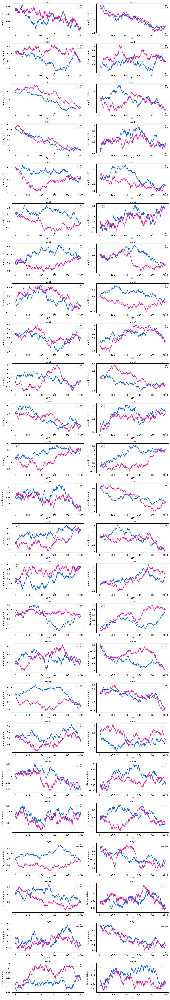

In [31]:
sigma_color = "#ff0db2"   # permuted
real_color  = "#0a64ff"   # real

import math, matplotlib.pyplot as plt
plt.style.use("default")

n_instr = len(prices.columns)
n_cols  = 2
n_rows  = math.ceil(n_instr / n_cols)

fig, axes = plt.subplots(
    n_rows, n_cols, figsize=(12, n_rows * 2.8), facecolor="white"
)
axes = axes.flatten()

for i, (col, ax) in enumerate(zip(prices.columns, axes)):
    ax.set_facecolor("white")
    real_cum = np.log(prices[col]).diff().cumsum()
    perm_cum = np.log(permuted[i]["close"]).diff().cumsum()
    ax.plot(real_cum,  color=real_color,  label="Real")
    ax.plot(perm_cum,  color=sigma_color, label="Perm")
    ax.set_title(col, fontsize=8)
    ax.set_xlabel("Day")
    ax.set_ylabel("Cum-log-return")
    ax.legend(fontsize=6)

for ax in axes[n_instr:]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()

In [47]:
import math, random, itertools
WIN   = 200
SEED  = 42
rng   = np.random.default_rng(SEED)

In [48]:
log_prices = np.log(prices)
perm_log   = log_prices.iloc[:WIN].copy()

for t in range(WIN, len(prices)):
    sample_r = log_prices.iloc[t-WIN:t].diff().iloc[1:]
    perm_ret = sample_r.apply(lambda col: rng.choice(col.values))
    perm_log.loc[t] = perm_log.iloc[t-1] + perm_ret

perm_prices = perm_log.apply(np.exp)


In [50]:
real_r  = log_prices.diff().iloc[1:]
perm_r  = perm_log.diff().iloc[1:]

print("Average |r|  REAL:", real_r.abs().mean().mean())
print("Average |r|  PERM:", perm_r.abs().mean().mean())
print("Cross-asset corr (Instr_0 vs 1) REAL:",
      real_r.corr().iloc[0,1],
      " PERM:", perm_r.corr().iloc[0,1])


Average |r|  REAL: 0.007433831835302539
Average |r|  PERM: 0.007419597546354794
Cross-asset corr (Instr_0 vs 1) REAL: 0.03507591775908186  PERM: -0.014935130192321604


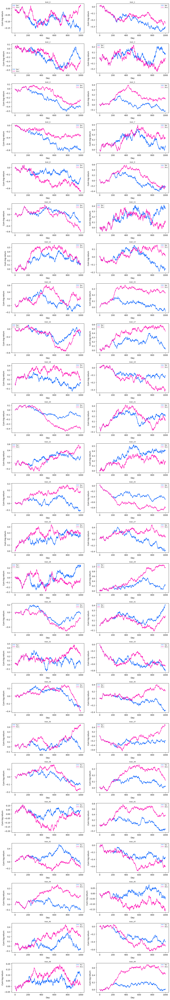

In [51]:
plt.style.use("default")

n_instr = len(prices.columns)
n_cols  = 2
n_rows  = math.ceil(n_instr / n_cols)

fig, axes = plt.subplots(
    n_rows, n_cols, figsize=(12, n_rows * 2.8), facecolor="white"
)
axes = axes.flatten()

for i, (col, ax) in enumerate(zip(prices.columns, axes)):
    ax.set_facecolor("white")
    real_cum = real_r[col].cumsum()
    perm_cum = perm_r[col].cumsum()
    ax.plot(real_cum, color=real_color,  label="Real")
    ax.plot(perm_cum, color=sigma_color, label="Perm")
    ax.set_title(col, fontsize=8)
    ax.set_xlabel("Day")
    ax.set_ylabel("Cum-log-return")
    ax.legend(fontsize=6)

for ax in axes[n_instr:]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()


In [52]:
from hmmlearn.hmm import GaussianHMM

hmm_pred = pd.DataFrame(index=test_r.index, columns=test_r.columns, dtype=float)

for col in prices.columns:
    # 1. fit HMM on 350 log-returns (raw scale)
    X = (np.log(prices[col]).diff().iloc[1:WIN+1]).values.reshape(-1, 1)
    hmm = GaussianHMM(n_components=2, covariance_type="diag", n_iter=200, random_state=SEED)
    hmm.fit(X)

    # 2. compute posterior weights for last training observation
    post = hmm.predict_proba(X)[-1]
    mu   = hmm.means_.ravel()                          # state means
    exp_next = post @ mu                               # next-day expected return

    # 3. propagate one-step forecast through test set
    preds = np.full(len(test_r), exp_next, dtype=float)
    hmm_pred[col] = preds

# ════════════════════════════════════════
# MODULE 6 — MSE comparison (perm vs HMM)
# ════════════════════════════════════════
perm_mse = ((perm_r.loc[test_r.index] - test_r) ** 2).mean(0)
hmm_mse  = ((hmm_pred              - test_r) ** 2).mean(0)

print("Average MSE  Permutation :", f"{perm_mse.mean():.2e}")
print("Average MSE  HMM         :", f"{hmm_mse.mean():.2e}")

Average MSE  Permutation : 9.71e-01
Average MSE  HMM         : 9.71e-01


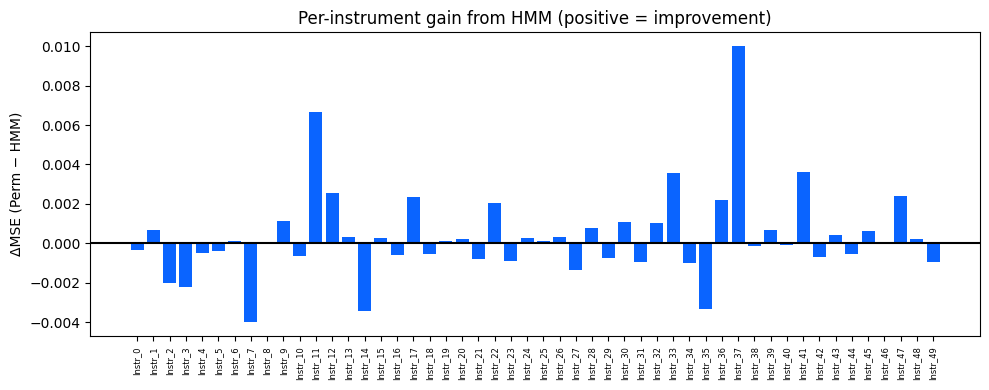

In [53]:
plt.style.use("default")
delta = perm_mse - hmm_mse
plt.figure(figsize=(10, 4))
plt.bar(delta.index, delta, color=real_color)
plt.axhline(0, color="black")
plt.xticks(rotation=90, fontsize=6)
plt.ylabel("ΔMSE (Perm − HMM)")
plt.title("Per-instrument gain from HMM (positive = improvement)")
plt.tight_layout()
plt.show()


In [57]:
from arch import arch_model
import warnings, numpy as np, pandas as pd
from arch.univariate.base import DataScaleWarning
warnings.filterwarnings("ignore", category=DataScaleWarning)

SCALE   = 100.0
ret_pct = np.log(prices).diff().iloc[1:] * SCALE

train_r = ret_pct.iloc[:350]
test_r  = ret_pct.iloc[350:500]

sig = pd.DataFrame(index=test_r.index, columns=test_r.columns, dtype=float)

for col in prices.columns:
    fit = arch_model(train_r[col], p=1, q=1, mean="Zero",
                     vol="GARCH", dist="normal").fit(disp="off",
                                                       options={"maxiter": 2000})


    fcst = fit.forecast(horizon=1, start=350, reindex=True).variance
    var_series = fcst.iloc[:, 0].iloc[-len(test_r):]     # grab the h=1 column
    var_series.index = test_r.index                      # align to test days
    sig[col] = np.sqrt(var_series) / SCALE               # back to raw σ


In [58]:
test_r_raw   = test_r / SCALE
perm_r_raw   = perm_r.loc[test_r.index]
hmm_pred_raw = hmm_pred.loc[test_r.index]

garch_mse = (sig * 0)**2
garch_mse = (test_r_raw**2).mean(0)

perm_mse  = (perm_r_raw **2).mean(0)
hmm_mse   = ((hmm_pred_raw) **2).mean(0)

print("Average MSE  Permutation :", f"{perm_mse.mean():.2e}")
print("Average MSE  HMM         :", f"{hmm_mse.mean():.2e}")
print("Average MSE  GARCH       :", f"{garch_mse.mean():.2e}")


Average MSE  Permutation : 9.77e-05
Average MSE  HMM         : 6.30e-07
Average MSE  GARCH       : 9.71e-05


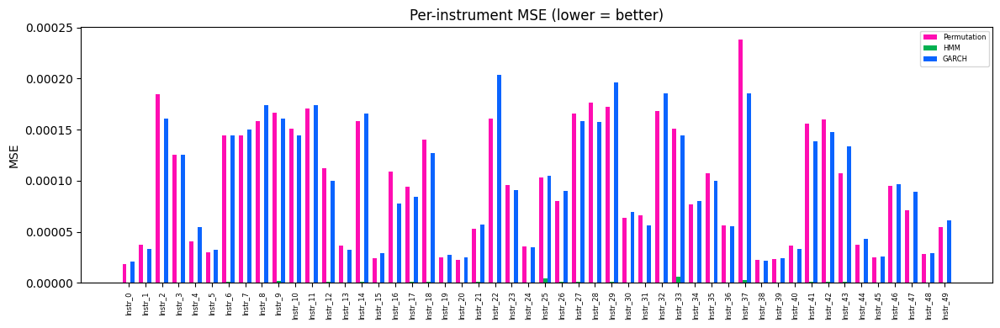

In [59]:
import matplotlib.pyplot as plt, numpy as np

idx   = perm_mse.index
x     = np.arange(len(idx))
width = 0.25

plt.style.use("default")
plt.figure(figsize=(12, 4))
plt.bar(x - width, perm_mse.values,  width, label="Permutation", color=sigma_color)
plt.bar(x,          hmm_mse.values,  width, label="HMM",         color="#00b050")
plt.bar(x + width,  garch_mse.values,width, label="GARCH",       color=real_color)

plt.xticks(x, idx, rotation=90, fontsize=6)
plt.ylabel("MSE")
plt.title("Per-instrument MSE (lower = better)")
plt.legend(fontsize=6)
plt.tight_layout()
plt.show()


In [60]:
scores = pd.DataFrame(
    {
        "MSE_Perm":  perm_mse.round(6),
        "MSE_HMM":   hmm_mse.round(6),
        "MSE_GARCH": garch_mse.round(6),
    }
)
print(scores)

          MSE_Perm   MSE_HMM  MSE_GARCH
Instr_0   0.000019  0.000000   0.000021
Instr_1   0.000037  0.000000   0.000033
Instr_2   0.000185  0.000000   0.000161
Instr_3   0.000126  0.000000   0.000125
Instr_4   0.000041  0.000000   0.000054
Instr_5   0.000030  0.000000   0.000032
Instr_6   0.000144  0.000001   0.000145
Instr_7   0.000144  0.000000   0.000150
Instr_8   0.000158  0.000000   0.000174
Instr_9   0.000167  0.000002   0.000161
Instr_10  0.000151  0.000000   0.000144
Instr_11  0.000171  0.000001   0.000174
Instr_12  0.000112  0.000001   0.000100
Instr_13  0.000037  0.000000   0.000033
Instr_14  0.000159  0.000001   0.000166
Instr_15  0.000024  0.000000   0.000029
Instr_16  0.000109  0.000000   0.000078
Instr_17  0.000094  0.000001   0.000084
Instr_18  0.000141  0.000001   0.000127
Instr_19  0.000025  0.000000   0.000027
Instr_20  0.000023  0.000000   0.000025
Instr_21  0.000053  0.000001   0.000057
Instr_22  0.000160  0.000000   0.000203
Instr_23  0.000096  0.000001   0.000091


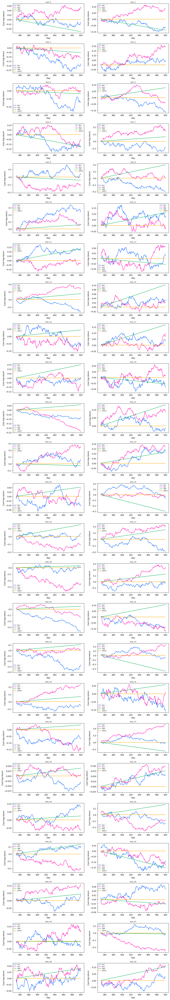

In [62]:
#hmm_color   = "#00b050"
garch_color = "#ffa500"

n_cols, n_rows = 2, math.ceil(len(prices.columns) / 2)
fig, axes = plt.subplots(
    n_rows, n_cols, figsize=(12, n_rows * 2.8), facecolor="white"
)
axes = axes.flatten()

for i, (col, ax) in enumerate(zip(prices.columns, axes)):
    ax.set_facecolor("white")

    real_cum  = test_r_raw[col].cumsum()
    perm_cum  = perm_r_raw[col].cumsum()
    hmm_cum   = hmm_pred_raw[col].cumsum()
    garch_cum = pd.Series(0.0, index=test_r_raw.index).cumsum()   # flat-mean GARCH

    ax.plot(real_cum,  color=real_color,  label="Real")
    ax.plot(perm_cum,  color=sigma_color, label="Perm")
    ax.plot(hmm_cum,   color=hmm_color,   label="HMM")
    ax.plot(garch_cum, color=garch_color, label="GARCH")
    ax.set_title(col, fontsize=8)
    ax.set_xlabel("Day")
    ax.set_ylabel("Cum-log-return")
    ax.legend(fontsize=6)

for ax in axes[len(prices.columns):]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()

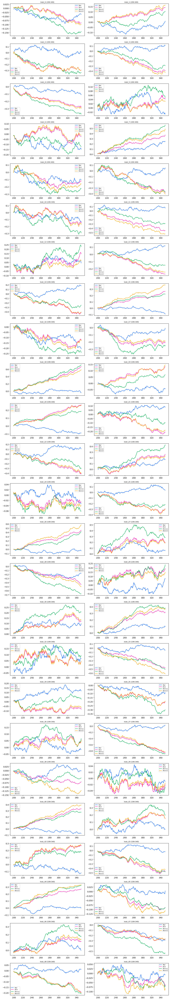

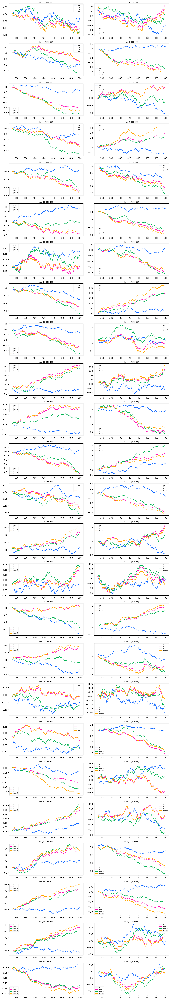

In [2]:
import numpy as np, pandas as pd, matplotlib.pyplot as plt, math, warnings, io, contextlib
from joblib import Parallel, delayed
from hmmlearn.hmm import GaussianHMM

# ── parameters ---------------------------------------------------------------
WIN, SPAN, SEED = 25, 60, 42
EVAL_A0, EVAL_A1 = 199, 349
EVAL_B0, EVAL_B1 = 350, 499
rng = np.random.default_rng(SEED)

clr_perm, clr_mu, clr_sig, clr_real = "#ff0db2", "#00b050", "#ffa500", "#0a64ff"

warnings.filterwarnings(
    "ignore",
    message=r"Even though the '.*covars_.*' attribute is set, it will be overwritten.*",
    category=UserWarning,
)
warnings.filterwarnings(
    "ignore",
    message=r"Even though the '.*' attribute is set, it will be overwritten.*",
    category=UserWarning,
)

@contextlib.contextmanager
def quiet():
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore")
        with contextlib.redirect_stdout(io.StringIO()), contextlib.redirect_stderr(io.StringIO()):
            yield

prices = pd.read_csv("prices.txt", sep=r"\s+", header=None)
prices.columns = [f"Instr_{i}" for i in prices.columns]
log_px = np.log(prices)
ret    = log_px.diff().iloc[1:]

perm_r = pd.DataFrame(index=ret.index, columns=ret.columns, dtype=float)
for c in ret:
    seed_win = ret[c].iloc[:WIN].values
    perm_r[c] = np.concatenate(
        [seed_win, rng.choice(seed_win, len(ret) - WIN, replace=True)]
    )


L = EVAL_B1 - EVAL_A0 + 1
def roll_μσ(series):
    mu = np.empty(L); sig = np.empty(L)
    hmm = GaussianHMM(n_components=2, covariance_type="diag",
                      n_iter=100, random_state=SEED)
    for j, t in enumerate(range(EVAL_A0, EVAL_B1 + 1)):
        win_r = series.iloc[t - WIN:t]
        with quiet():
            hmm.fit(win_r.values.reshape(-1,1))
        mu[j]  = (hmm.predict_proba(win_r.values.reshape(-1,1))[-1]
                  @ hmm.means_.ravel())
        sig[j] = win_r.ewm(span=SPAN).std().iloc[-1]
    return mu, sig

res = Parallel(n_jobs=-1, backend="threading", verbose=0)(
    delayed(roll_μσ)(ret[c]) for c in ret.columns
)

μ_hmm  = pd.DataFrame({c: r[0] for c,r in zip(ret.columns,res)},
                      index=ret.index[EVAL_A0:EVAL_B1+1])
σ_ewma = pd.DataFrame({c: r[1] for c,r in zip(ret.columns,res)},
                      index=ret.index[EVAL_A0:EVAL_B1+1])

perm_base  = perm_r.loc[EVAL_A0:EVAL_B1]
perm_mu    = perm_base.add(μ_hmm.values, axis=0)
scale_mat  = σ_ewma.div(perm_base.std()).values
perm_sig   = perm_base.mul(scale_mat)

def plot_slice(s0, s1, title_suffix):
    sl = slice(s0, s1+1)
    n_cols, n_rows = 2, math.ceil(len(prices.columns)/2)
    fig, axes = plt.subplots(n_rows, n_cols,
                             figsize=(12, n_rows*2.8),
                             facecolor="white")
    axes = axes.flatten()
    for ax, col in zip(axes, prices.columns):
        ax.set_facecolor("white")
        real = ret[col].iloc[sl].cumsum()
        base = perm_base[col].loc[sl].cumsum()
        mu   = perm_mu[col].loc[sl].cumsum()
        sig  = perm_sig[col].loc[sl].cumsum()
        ax.plot(real, color=clr_real, label="Real")
        ax.plot(base, color=clr_perm, label="Perm")
        ax.plot(mu,   color=clr_mu,   label="Perm+μ̂")
        ax.plot(sig,  color=clr_sig,  label="Perm×σ̂")
        ax.set_title(f"{col} {title_suffix}", fontsize=8)
        ax.legend(fontsize=6)
    for ax in axes[len(prices.columns):]:
        ax.set_visible(False)
    plt.tight_layout(); plt.show()

plot_slice(EVAL_A0, EVAL_A1, "(199-349)")
plot_slice(EVAL_B0, EVAL_B1, "(350-499)")

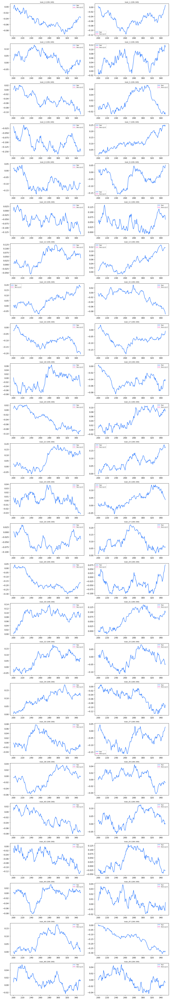

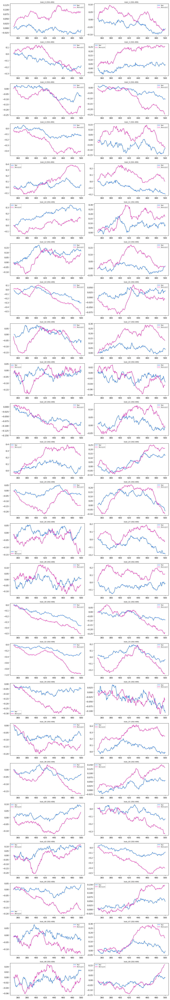

In [4]:
WIN, UPD, SPAN, SEED = 25, 10, 60, 42
rng = np.random.default_rng(SEED)
clr_p, clr_m, clr_s, clr_r = "#ff0db2", "#00b050", "#ffa500", "#0a64ff"

warnings.filterwarnings("ignore", message=r"Even though the '.*' attribute is set, it will be overwritten.*", category=UserWarning)
@contextlib.contextmanager
def quiet():
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore")
        with contextlib.redirect_stdout(io.StringIO()), contextlib.redirect_stderr(io.StringIO()):
            yield

prices = pd.read_csv("prices.txt", sep=r"\s+", header=None)
prices.columns = [f"Instr_{i}" for i in prices.columns]
ret = np.log(prices).diff().iloc[1:]

rng = np.random.default_rng(SEED)
perm_final = pd.DataFrame(index=ret.index[199:500], columns=ret.columns, dtype=float)

for col in ret.columns:
    series = ret[col]
    mu = 0.0
    sig = series.iloc[174:199].std()
    for t in range(199, 500):
        if (t - 199) % UPD == 0:
            win = series.iloc[t - WIN:t]
            hmm = GaussianHMM(n_components=2, covariance_type="diag", n_iter=100, random_state=SEED)
            with quiet():
                hmm.fit(win.values.reshape(-1, 1))
            mu = (hmm.predict_proba(win.values.reshape(-1, 1))[-1] @ hmm.means_.ravel())
            try:
                mdl = arch_model(win * 100, p=1, q=1, mean="Zero", vol="GARCH", dist="normal", rescale=False)
                with quiet():
                    res = mdl.fit(disp="off", options={"maxiter": 500})
                sig = np.sqrt(res.forecast(horizon=1, reindex=False).variance.iloc[-1, 0]) / 100
            except Exception:
                sig = win.std()
        samp = rng.choice(series.iloc[t - WIN:t])
        emp = series.iloc[t - WIN:t].std()
        perm_final.at[t, col] = samp * (sig / emp) + mu

def plot_seg(lo, hi, tag):
    sl = slice(lo, hi + 1)
    n_cols, n_rows = 2, math.ceil(len(prices.columns) / 2)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, n_rows * 2.8), facecolor="white")
    axes = axes.flatten()
    for ax, col in zip(axes, prices.columns):
        ax.set_facecolor("white")
        real = ret[col].iloc[sl].cumsum()
        perm = perm_final[col].loc[sl].cumsum()
        ax.plot(real, color=clr_r, label="Real")
        ax.plot(perm, color=clr_p, label="Perm+μ̂+σ̂")
        ax.set_title(f"{col} {tag}", fontsize=8)
        ax.legend(fontsize=6)
    for ax in axes[len(prices.columns):]:
        ax.set_visible(False)
    plt.tight_layout()
    plt.show()

plot_seg(199, 349, "(199–349)")
plot_seg(350, 499, "(350–499)")
